* [1.DataOverview](#1.DataOverview)
* [2.Visualization](#2.Visualization)
    * [2.1 No.37 car's location](#21)
    * [2.2 Distribution of cars for total_cars=1](#22)
    * [2.3 Distribution of cars for total_cars=2](#23)
    * [2.4 Distribution of cars for total_cars>=3](#24)

# 1.DataOverview

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import os
import geopandas as gpd
import folium
from folium import plugins
import datetime 
import re

In [2]:
os.listdir("../input/autotel-shared-car-locations")

['sample_table.csv']

In [3]:
data=pd.read_csv("../input/autotel-shared-car-locations/sample_table.csv")
data.head()
data=data[data['total_cars']>0]

In [4]:
data.isnull().sum()

timestamp     0
latitude      0
longitude     0
total_cars    0
carsList      0
dtype: int64

In [5]:
data['date']=data.timestamp.apply(lambda x:x.split(' ')[0])
pd.to_datetime(data['date'])

0         2019-01-10
1         2019-01-10
2         2019-01-10
3         2019-01-10
4         2019-01-10
             ...    
6683554   2019-01-03
6683555   2019-01-07
6683556   2019-01-07
6683557   2018-12-31
6683558   2018-12-31
Name: date, Length: 3584033, dtype: datetime64[ns]

# 2.Visualization

Text(0.5, 0, 'cars')

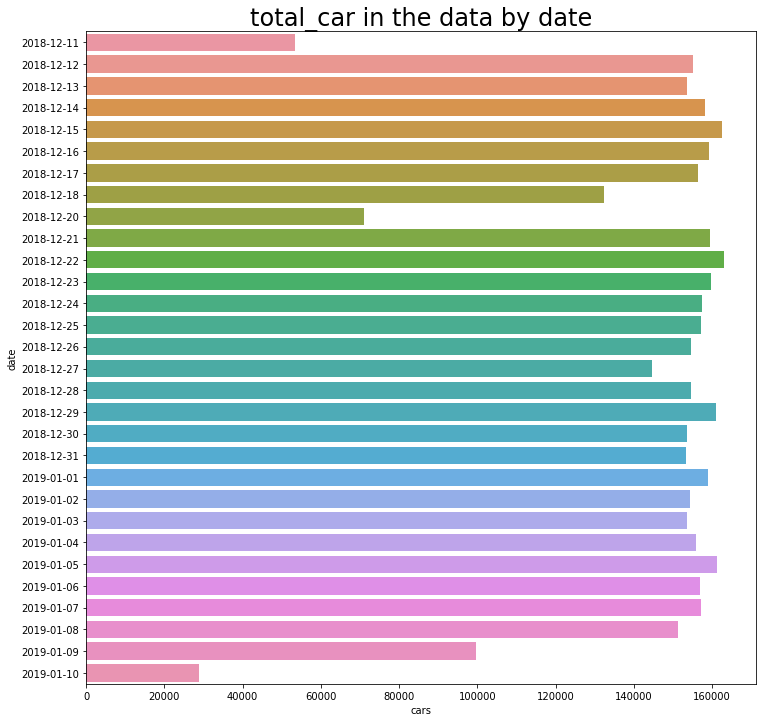

In [6]:
plt.figure(figsize=(12,12))
y=data.groupby('date')['total_cars'].agg('sum').index
x=data.groupby('date')['total_cars'].agg('sum')
sns.barplot(x=x,y=y)
plt.title("total_car in the data by date",size=24)
plt.xlabel('cars')

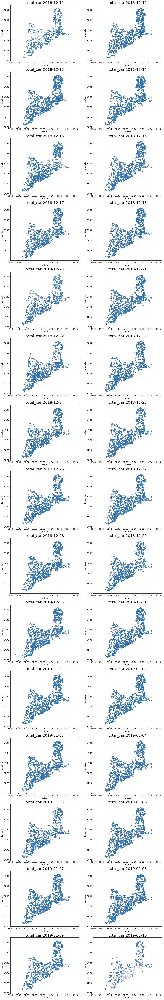

In [7]:
index=data.groupby('date')['timestamp'].agg('count').index
plt.figure(figsize=(15,100))
for i in range(len(index)):
    plt.subplot(15,2,i+1)
    sns.scatterplot(x='latitude',y='longitude',alpha=0.01,data=data[data.date==index[i]])
    plt.title('total_car '+index[i],size=20)
    plt.xlim(32,32.17)
    plt.ylim(34.74,34.85)
    

In [8]:
data.carsList.apply(lambda x:x.strip('[]'))
data['carsList']=data.carsList.apply(lambda x:x.strip('[]'))
data.head()

,timestamp,latitude,longitude,total_cars,carsList,date
0,2019-01-10 11:45:55.070781 UTC,32.09995,34.78794,1,182,2019-01-10
1,2019-01-10 11:45:55.070781 UTC,32.06567,34.79612,1,268,2019-01-10
2,2019-01-10 11:45:55.070781 UTC,32.06465,34.80322,1,106,2019-01-10
3,2019-01-10 11:45:55.070781 UTC,32.05978,34.81034,1,180,2019-01-10
4,2019-01-10 11:45:55.070781 UTC,32.05133,34.75089,1,16,2019-01-10


<h3 id="21">2.1 No.37 car's location</h3>

In [9]:
data_37=data[data.carsList.apply(lambda x:re.match('37',x)!=None)]
data_37_new=data_37[data.date==data_37.date.unique()[0]].drop_duplicates(subset=['longitude'])
for i in range(1,len(data_37.date.unique())):
    data_37_concate=data_37[data.date==data_37.date.unique()[i]].drop_duplicates(subset=['longitude'])
    data_37_new=pd.concat([data_37_new,data_37_concate],axis=0)

Long=34.78
Lat=32.05
data_37_map=folium.Map([Lat,Long],zoom_start=12)

data_37_cars_map=plugins.MarkerCluster().add_to(data_37_map)
for lat,lon,label in zip(data_37_new.latitude,data_37_new.longitude,data_37_new.timestamp):
    folium.Marker(location=[lat,lon],icon=None,popup=label).add_to(data_37_cars_map)
data_37_map.add_child(data_37_cars_map)

data_37_map

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.


In [10]:
data_37=data[data.carsList.apply(lambda x:re.match('37',x)!=None)]
data_37_new=data_37[data.date==data_37.date.unique()[0]].drop_duplicates(subset=['latitude'])
for i in range(1,len(data_37.date.unique())):
    data_37_concate=data_37[data.date==data_37.date.unique()[i]].drop_duplicates(subset=['latitude'])
    data_37_new=pd.concat([data_37_new,data_37_concate],axis=0)

Long=34.78
Lat=32.05
data_37_map=folium.Map([Lat,Long],zoom_start=12)

data_37_cars_map=plugins.MarkerCluster().add_to(data_37_map)
for lat,lon,label in zip(data_37_new.latitude,data_37_new.longitude,data_37_new.timestamp):
    folium.Marker(location=[lat,lon],icon=None,popup=label).add_to(data_37_cars_map)
data_37_map.add_child(data_37_cars_map)

data_37_map

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.


<h3 id="22">2.2 Distribution of cars for total_cars=1</h3> 

In [11]:
data_total_cars_1=data[data.total_cars==1].drop_duplicates(subset=['latitude'])[:2000]
data_total_cars_1.head()

,timestamp,latitude,longitude,total_cars,carsList,date
0,2019-01-10 11:45:55.070781 UTC,32.09995,34.78794,1,182,2019-01-10
1,2019-01-10 11:45:55.070781 UTC,32.06567,34.79612,1,268,2019-01-10
2,2019-01-10 11:45:55.070781 UTC,32.06465,34.80322,1,106,2019-01-10
3,2019-01-10 11:45:55.070781 UTC,32.05978,34.81034,1,180,2019-01-10
4,2019-01-10 11:45:55.070781 UTC,32.05133,34.75089,1,16,2019-01-10


In [12]:
Long=34.78
Lat=32.05
data_total_cars_1_map=folium.Map([Lat,Long],zoom_start=12)
data_total_cars_1['label']=data_total_cars_1.apply(lambda x: (x['timestamp'],'car:'+str(x['carsList'])),axis=1)

data_total_cars_1_cars_map=plugins.MarkerCluster().add_to(data_total_cars_1_map)
for lat,lon,label in zip(data_total_cars_1.latitude,data_total_cars_1.longitude,data_total_cars_1.label):
    folium.Marker(location=[lat,lon],icon=None,popup=label).add_to(data_total_cars_1_cars_map)
data_total_cars_1_map.add_child(data_total_cars_1_cars_map)

data_total_cars_1_map

In [13]:
data_total_cars_2=data[data.total_cars==1].drop_duplicates(subset=['latitude'])[2000:4000]
Long=34.78
Lat=32.05
data_total_cars_2_map=folium.Map([Lat,Long],zoom_start=12)
data_total_cars_2['label']=data_total_cars_2.apply(lambda x: (x['timestamp'],'car:'+str(x['carsList'])),axis=1)

data_total_cars_2_cars_map=plugins.MarkerCluster().add_to(data_total_cars_2_map)
for lat,lon,label in zip(data_total_cars_2.latitude,data_total_cars_2.longitude,data_total_cars_2.label):
    folium.Marker(location=[lat,lon],icon=None,popup=label).add_to(data_total_cars_2_cars_map)
data_total_cars_2_map.add_child(data_total_cars_2_cars_map)

data_total_cars_2_map

In [14]:
data_total_cars_3=data[data.total_cars==1].drop_duplicates(subset=['latitude'])[4000:6000]
Long=34.78
Lat=32.05
data_total_cars_3_map=folium.Map([Lat,Long],zoom_start=12)
data_total_cars_3['label']=data_total_cars_3.apply(lambda x: (x['timestamp'],'car:'+str(x['carsList'])),axis=1)

data_total_cars_3_cars_map=plugins.MarkerCluster().add_to(data_total_cars_3_map)
for lat,lon,label in zip(data_total_cars_3.latitude,data_total_cars_3.longitude,data_total_cars_3.label):
    folium.Marker(location=[lat,lon],icon=None,popup=label).add_to(data_total_cars_3_cars_map)
data_total_cars_3_map.add_child(data_total_cars_3_cars_map)

data_total_cars_3_map

In [15]:
data_total_cars_4=data[data.total_cars==1].drop_duplicates(subset=['latitude'])[6000:8000]
Long=34.78
Lat=32.05
data_total_cars_4_map=folium.Map([Lat,Long],zoom_start=12)
data_total_cars_4['label']=data_total_cars_4.apply(lambda x: (x['timestamp'],'car:'+str(x['carsList'])),axis=1)

data_total_cars_4_cars_map=plugins.MarkerCluster().add_to(data_total_cars_4_map)
for lat,lon,label in zip(data_total_cars_4.latitude,data_total_cars_4.longitude,data_total_cars_4.label):
    folium.Marker(location=[lat,lon],icon=None,popup=label).add_to(data_total_cars_4_cars_map)
data_total_cars_4_map.add_child(data_total_cars_4_cars_map)

data_total_cars_4_map

In [16]:
data_total_cars_5=data[data.total_cars==1].drop_duplicates(subset=['latitude'])[8000:-1]
Long=34.78
Lat=32.05
data_total_cars_5_map=folium.Map([Lat,Long],zoom_start=12)
data_total_cars_5['label']=data_total_cars_5.apply(lambda x: (x['timestamp'],'car:'+str(x['carsList'])),axis=1)

data_total_cars_5_cars_map=plugins.MarkerCluster().add_to(data_total_cars_5_map)
for lat,lon,label in zip(data_total_cars_5.latitude,data_total_cars_5.longitude,data_total_cars_5.label):
    folium.Marker(location=[lat,lon],icon=None,popup=label).add_to(data_total_cars_5_cars_map)
data_total_cars_5_map.add_child(data_total_cars_5_cars_map)

data_total_cars_5_map

<h3 id="23">2.3 Distribution of cars for total_cars=2</h3>

In [17]:
data_total_cars_6=data[data.total_cars==2].drop_duplicates(subset=['latitude'])
data_total_cars_6.head()


,timestamp,latitude,longitude,total_cars,carsList,date
31,2019-01-10 11:45:55.070781 UTC,32.065721,34.776917,2,"38, 237",2019-01-10
32,2019-01-10 11:45:55.070781 UTC,32.061700,34.784400,2,"7, 96",2019-01-10
33,2019-01-10 11:45:55.070781 UTC,32.107998,34.802707,2,"240, 245",2019-01-10
57,2019-01-10 11:50:04.533343 UTC,32.072000,34.791100,2,"152, 220",2019-01-10
59,2019-01-10 11:50:04.533343 UTC,32.117818,34.839188,2,"43, 79",2019-01-10


In [18]:
Long=34.78
Lat=32.05
data_total_cars_6_map=folium.Map([Lat,Long],zoom_start=12)
data_total_cars_6['label']=data_total_cars_6.apply(lambda x: (x['timestamp'],'car:'+str(x['carsList'])),axis=1)

data_total_cars_6_cars_map=plugins.MarkerCluster().add_to(data_total_cars_6_map)
for lat,lon,label in zip(data_total_cars_6.latitude,data_total_cars_6.longitude,data_total_cars_6.label):
    folium.Marker(location=[lat,lon],icon=None,popup=label).add_to(data_total_cars_6_cars_map)
data_total_cars_6_map.add_child(data_total_cars_6_cars_map)

data_total_cars_6_map

<h3 id="24">2.4 Distribution of cars for total_cars>=3</h3>

In [19]:
data_total_cars_7=data[data.total_cars>=3].drop_duplicates(subset=['latitude'])
data_total_cars_7.head()

,timestamp,latitude,longitude,total_cars,carsList,date
34,2019-01-10 11:45:55.070781 UTC,32.109700,34.840800,3,"104, 162, 243",2019-01-10
61,2019-01-10 11:50:04.533343 UTC,32.103400,34.805900,4,"125, 195, 238, 264",2019-01-10
129,2019-01-10 09:38:52.434456 UTC,32.106567,34.832598,3,"18, 230, 248",2019-01-10
200,2019-01-10 11:16:45.883965 UTC,32.036900,34.762500,4,"145, 151, 207, 214",2019-01-10
462,2019-01-10 12:15:03.425963 UTC,32.084900,34.796600,3,"69, 115, 120",2019-01-10


In [20]:
Long=34.78
Lat=32.05
data_total_cars_7_map=folium.Map([Lat,Long],zoom_start=12)
data_total_cars_7['label']=data_total_cars_7.apply(lambda x: (x['timestamp'],'car:'+str(x['carsList'])),axis=1)

data_total_cars_7_cars_map=plugins.MarkerCluster().add_to(data_total_cars_7_map)
for lat,lon,label in zip(data_total_cars_7.latitude,data_total_cars_7.longitude,data_total_cars_7.label):
    folium.Marker(location=[lat,lon],icon=None,popup=label).add_to(data_total_cars_7_cars_map)
data_total_cars_7_map.add_child(data_total_cars_7_cars_map)

data_total_cars_7_map